In [1]:
from torch.utils.data import Dataset
import torch
import glob
import matplotlib.pyplot as plt
#import librosa.display
import numpy as np
import pandas as pd
import os
import math
import time
import matplotlib.pyplot as plt
import random

import librosa
import librosa.display
from scipy import signal
from tqdm import tqdm
import multiprocessing
import torchvision
from pathlib import Path

import datetime

/home/yhbedoya/VirtualEnvs/SHMmae_venv/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
class SHMDataset(Dataset):

    def __init__(self):
        self.day_start = datetime.date(2019,6,5)
        self.num_days = 1
        self.path = "/home/yhbedoya/Repositories/SHM-MAE/INSIST_SS335/"
        self.data = self._readCSV()
        self.sampleRate = 100
        self.frameLength = 198
        self.stepLength = 10
        self.windowLength= 990
        self.windowStep = 100
        self.data, self.limits, self.totalWindows, self.min, self.max = self._partitioner()

    def __len__(self):
        return self.totalWindows

    def __getitem__(self, index):
        start, end, power = self.limits[index]
        slice = self.data[start:end]
        frequencies, times, spectrogram = self._transformation(slice)
        spectrogram = torch.unsqueeze(torch.tensor(spectrogram, dtype=torch.float64), 0)
        NormSpect = self._normalizer(spectrogram).type(torch.float16)
        #print(f'type {type(NormSpect)}, inp shape: {slice.shape} out shape: {NormSpect.shape}')
        return frequencies, times, spectrogram, power

    def _readCSV(self):
        print(f'reading CSV files')
        
        ldf = []
        for x in range(self.num_days):
            yy, mm, dd = (self.day_start + datetime.timedelta(days=x)).strftime('%Y,%m,%d').split(",")
            date = f"{int(yy)}{int(mm)}{int(dd)}"
            df = pd.read_csv(self.path + f"ss335-acc-{date}.csv")
            ldf.append(df.drop(['x','y', "year", "month", "day", "Unnamed: 0"], axis=1))
        df = pd.concat(ldf).sort_values(by=['sens_pos', 'ts'])
        df = df.reset_index(drop=True)

        new_dict = {
            "ts": [],
            "sens_pos": [],
            "z": [],
        }
        conv = (1*2.5)*2**-15

        print(f'Creating the dataframe')
        for i in tqdm(range(len(df))):
            row = df["z"][i]
            data_splited = row.replace("\n", "").replace("[", "").replace("]", "").split(" ")
            #data_splited = df["z"][i].split(" ")
            ts = datetime.datetime.utcfromtimestamp(df["ts"][i]/1000)
            sens = df["sens_pos"][i]
            
            for idx, data in enumerate(data_splited):
                if data == "":
                    continue
                z = int(data)  
                new_dict["ts"].append(ts + idx*datetime.timedelta(milliseconds=10))
                new_dict["z"].append(z * conv)
                new_dict["sens_pos"].append(sens)
            #if i >100000:
            #    break

        df_new = pd.DataFrame(new_dict)
        print(f'Finish data reading')
        return df_new

    def _partitioner(self):
        sensors = self.data['sens_pos'].unique().tolist()
        print(f'start partitioner')
        partitions = {}
        cumulatedWindows = 0
        limits = dict()
        print(f'Generating windows')
        for sensor in tqdm(sensors):
            sensorData = self.data[self.data['sens_pos']==sensor]
            totalFrames = sensorData.shape[0]
            totalWindows = math.ceil((totalFrames-self.windowLength)/self.windowStep)
            start = cumulatedWindows
            cumulatedWindows += totalWindows
            end = cumulatedWindows
            indexStart = sensorData.index[0]
            partitions[sensor]= (start, end, indexStart)

        timeData = torch.tensor(self.data["z"].values, dtype=torch.float64)
        cummulator = -1

        mins = list()
        maxs = list()
        print(f'Defining useful windows limits')
        noiseFreeSpaces = 0
        indexes = list(range(0, cumulatedWindows))
        random.shuffle(indexes)

        for index in tqdm(indexes):
            if cummulator >= 30000:
                break
            for k,v in partitions.items():
                if index in range(v[0], v[1]):
                    start = v[2]+(index-v[0])*self.windowStep
                    filteredSlice = self.butter_bandpass_filter(timeData[start: start+self.windowLength], 0, 50, self.sampleRate)
                    signalPower = self.power(filteredSlice)

                    if True: #signalPower>1.25*10**-6:
                        cummulator += 1
                        limits[cummulator] = (start, start+self.windowLength, signalPower)
                        slice = timeData[start:start+self.windowLength]
                        frequencies, times, spectrogram = self._transformation(torch.tensor(slice, dtype=torch.float64))
                        mins.append(np.min(np.array(spectrogram)))
                        maxs.append(np.max(np.array(spectrogram)))
                    break
        print(f'Total windows in dataset: {cummulator}')
        min = np.min(np.array(mins))
        max = np.max(np.array(maxs))   
        print(f'General min: {min}')
        print(f'General max: {max}')
        return timeData, limits, cummulator, min, max

    def _transformation(self, slice):
        sliceN = slice-torch.mean(slice)
        frequencies, times, spectrogram = signal.spectrogram(sliceN,self.sampleRate,nfft=self.frameLength,noverlap=(self.frameLength - self.stepLength), nperseg=self.frameLength,mode='psd')

        return frequencies, times, np.log10(spectrogram)
    
    def _normalizer(self, spectrogram):
        spectrogramNorm = (spectrogram - self.min) / (self.max - self.min)
        return spectrogramNorm

    def butter_bandpass(self, lowcut, highcut, fs, order=5):
        return signal.butter(order, [1, 49], fs=fs, btype='band')

    def butter_bandpass_filter(self, slice, lowcut, highcut, fs, order=5):
        sliceN = slice-np.mean(np.array(slice))
        b, a = self.butter_bandpass(lowcut, highcut, fs, order=order)
        y = signal.lfilter(b, a, sliceN)
        return y
    
    def power(self, slice):
        signalPower = np.sqrt(np.mean(np.array(slice)**2))**2
        return signalPower

In [3]:
def plotSpect(frequencies, times, spectrogram, power):
    plt.figure(figsize=(10, 5))
    plt.title(f'PSD Spectrogram (Anomaly detection)')
    times= np.linspace(1, 10, 80)
    plt.pcolormesh(times, frequencies, 10*(np.squeeze(spectrogram)), vmin=-150, vmax=-50)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar(format="%+2.f", label='dB')
    #folder = "positives" if power > 1.25*10**-6 else "noise"
    #plt.savefig(f'/home/yhbedoya/Repositories/SHM-MAE/PowerINSIST/{folder}/{index}.png')
    #plt.close()

def task(gen, i):
    frequencies, times, spectrogram, power = gen[i]
    #means.append(np.mean(spectrogram))
    #vars.append(np.var(spectrogram))
    plotSpect(frequencies, times, spectrogram, i, power)

In [4]:
timer = list()
gen = SHMDataset()
processes = []
manager = multiprocessing.Manager()
means = manager.list()
vars = manager.list()

print(f"Total instances: {len(gen)}")

reading CSV files
Creating the dataframe


100%|██████████| 341746/341746 [00:40<00:00, 8543.26it/s] 


Finish data reading
start partitioner
Generating windows


100%|██████████| 70/70 [01:40<00:00,  1.43s/it]


Defining useful windows limits


  9%|▉         | 30001/340986 [00:23<04:05, 1267.77it/s]


Total windows in dataset: 30000
General min: -22.96086675595272
General max: -0.3530167406393919
Total instances: 30000


  8%|▊         | 17/200 [00:00<00:04, 39.11it/s]/home/yhbedoya/VirtualEnvs/SHMmae_venv/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
100%|██████████| 200/200 [00:05<00:00, 36.24it/s]


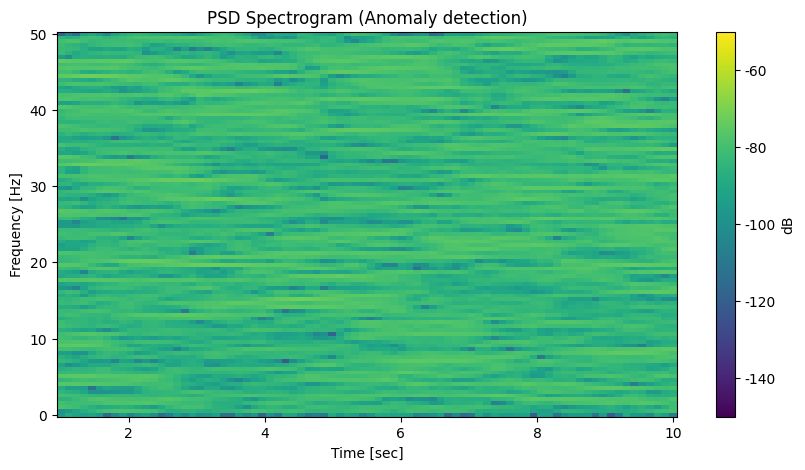

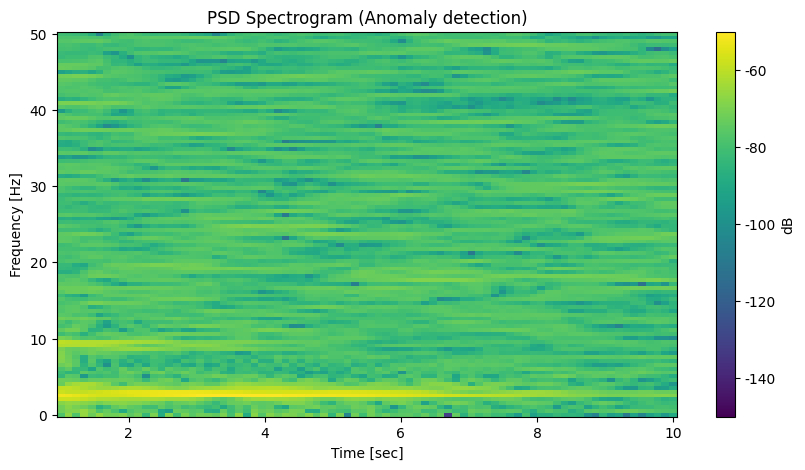

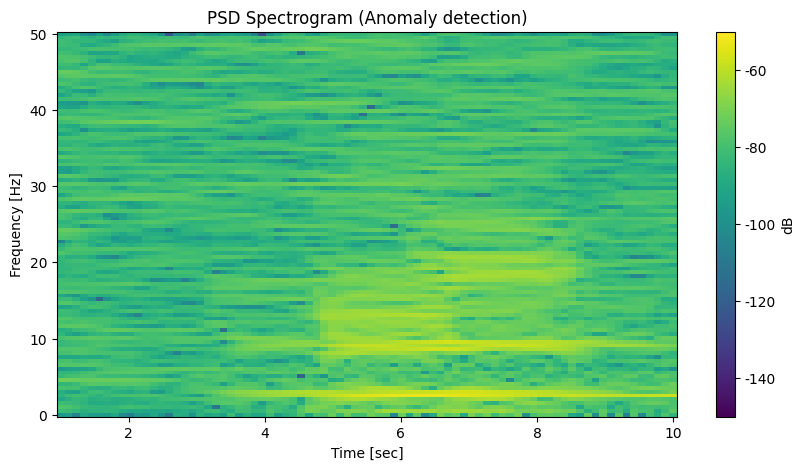

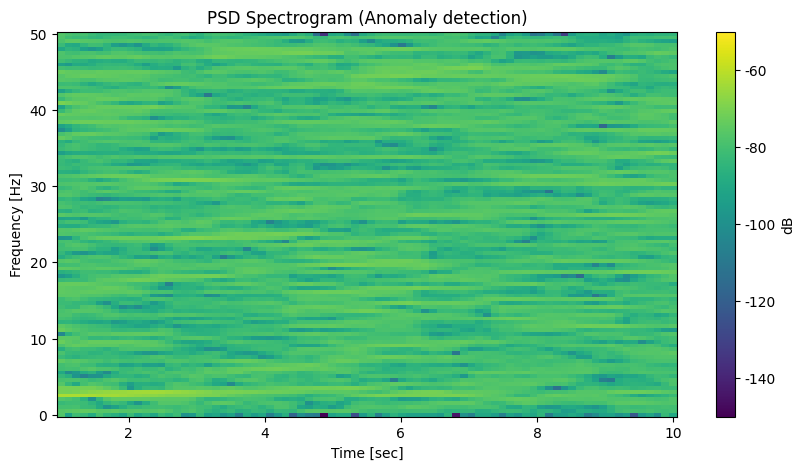

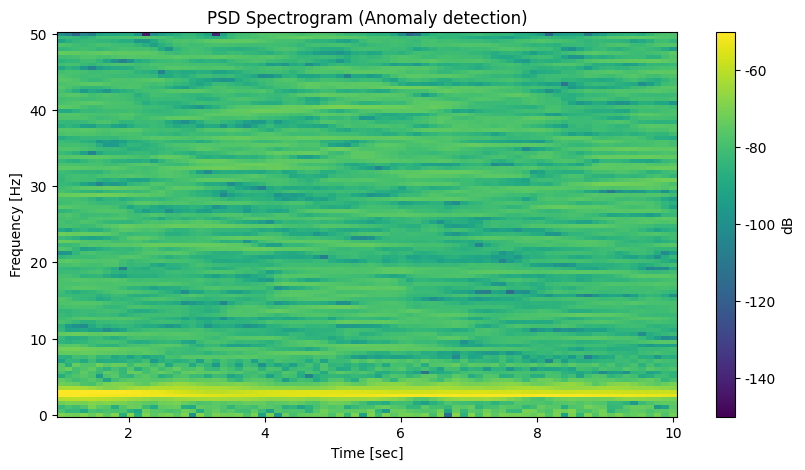

...

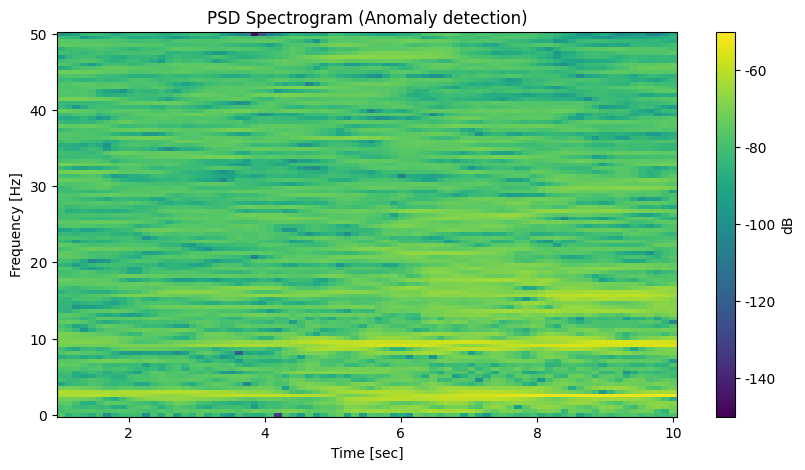

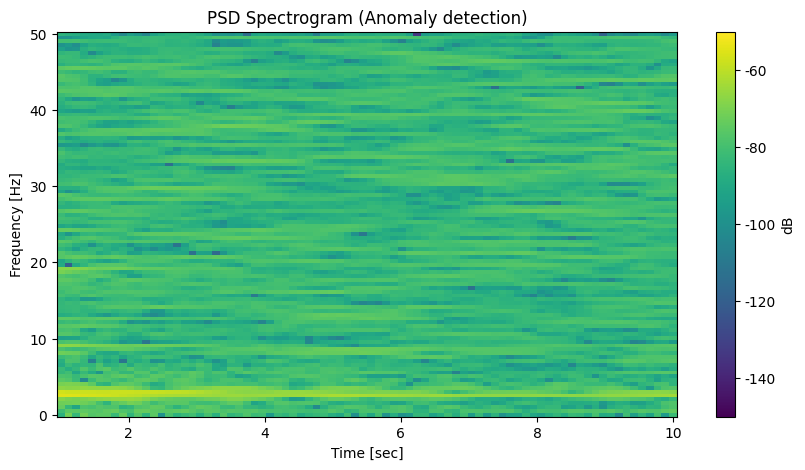

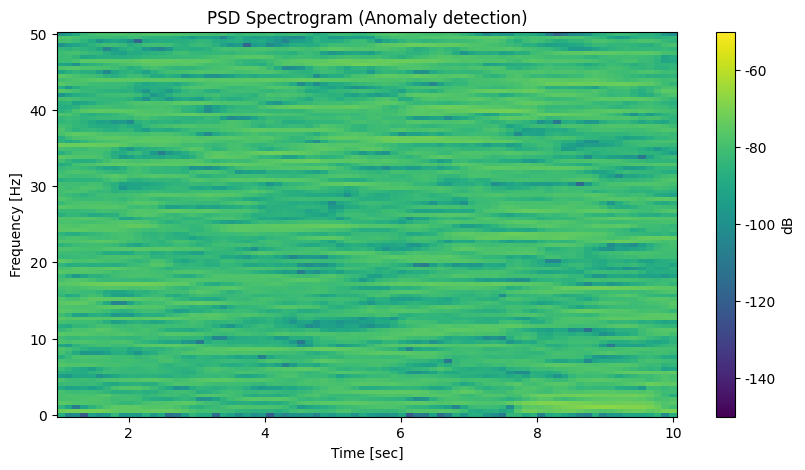

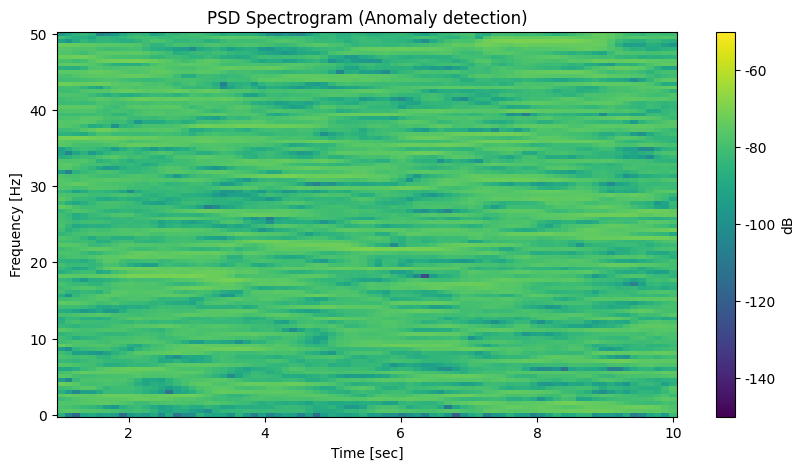

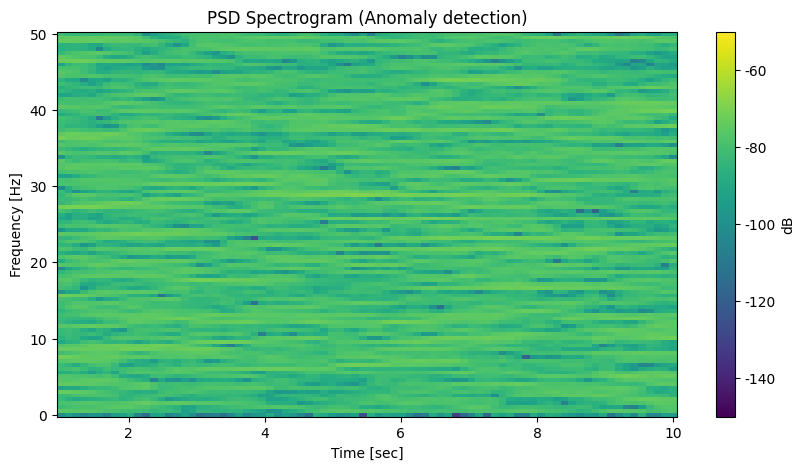

In [5]:
indexes = [random.randrange(0, len(gen)) for i in range(200)]
for i in tqdm(indexes):

    frequencies, times, spectrogram, signalPower = gen[i]
    plotSpect(frequencies, times, spectrogram, signalPower)

In [30]:
#indexes = [random.randrange(0, len(gen)) for i in range(10)]
indexes = range(0,len(gen))
powers = []
discard = 0
for i in tqdm(indexes):
    frequencies, times, spectrogram, power = gen[i]
    powers.append(power)

100%|██████████| 340985/340985 [02:25<00:00, 2347.63it/s]


In [80]:
vehicles = []
noise = []
points = []
for power in tqdm(powers):
    if power > 0.000005:
        continue
    points.append(power)
    if power > 1.25*10**-6: #1.25*10**-6
        vehicles.append(power)
    else:
        noise.append(power)

100%|██████████| 340985/340985 [00:00<00:00, 2623113.17it/s]


In [81]:
print(f"Total vehicles: {len(vehicles)}, total noise: {len(noise)}")

Total vehicles: 55766, total noise: 260225


In [82]:
max(vehicles)

4.999990154170067e-06

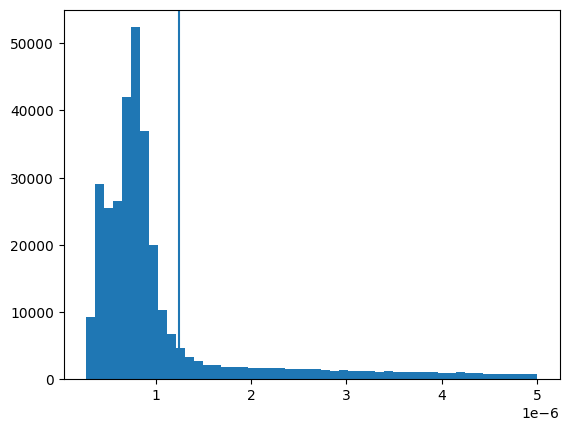

In [83]:
plt.hist(points, bins=50)
#plt.hist(noise, bins=50)
#plt.xlim(0, 1.25*10**-6)
plt.axvline(1.25*10**-6)